In [ ]:
#simpleITK ipyvolume diskcache cassandra-driver

In [2]:
pip install cassandra-driver


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install --upgrade diskcache


Note: you may need to restart the kernel to use updated packages.


In [6]:
import gzip
from diskcache import FanoutCache,Disk
from cassandra.cqltypes import BytesType
from diskcache import FanoutCache, Disk, core
from diskcache.core import io
from io import BytesIO

from diskcache.core import MODE_BINARY
from util.logconf import logging
log = logging.getLogger(_name_)
log.setLevel(logging.INFO)

ModuleNotFoundError: No module named 'util.logconf'; 'util' is not a package

In [ ]:
import matplotlib
matplotlib.use('nbagg')

import numpy as np
import matplotlib.pyplot as plt

from codel.dsets import Ct,LunaDataset

clim = (-1000,0,300)

In [ ]:
def findPositiveSamples(start_ndx = 0,limit=100):
    ds = LinaDataset()
    positiveSample_list = []
    for sample_tup in ds.candidateInfo_list:
        if sample_tup,isNodule_bool:
        #print(len(positiveSample_list),sample_tup)
        positiveSample_list.append(sample_tup)
        if len(positiveSample_list) >= limit:
            break
    return positiveSample_list        

In [ ]:
def showCandidate(series_uid,batch_ndx=None,**kwargs):
    ds = LunaDataset(series_uid=series_uid,**kwargs)
    pos_list = [i for i,x in enumerate(ds.candidateInfo_list) if x.isNodule_bool]

    if batch_ndx id None:
       if pos_list:
           batch_ndx = pos_list[0]
       else:
        print("warning:no positive samples found using first negative sample.")
        batch_ndx = 0
    ct = Ct(series_uid)
    ct_t,pos_t,series_uid,center_irc = ds[batch_ndx]
    ct_a = ct_t[0].numpy()

    fig = plt.figure(figsize=(30,50))
    group_list = [[9,11,13],[15,16,17],[19,21,23]]

#add_subplot[3,4,9]
    subplot = fig.add_subplot(len(group_list)+2,3,1)
    subplot.set_title('index()'.format(int(center_irc[0])),fontsize=30)

    for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct.hu_a[int(center_irc[0])],clim = clim,cmap='gray')


    subplot = fig.add_subplot(len(group_list)+2,3,2)
    subplot.set_title('row()'.format(int(center_irc[1])),fontsize=30)
    for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct.hu_a[:,int(center_irc[1])],clim = clim,cmap='gray')      #联行信息，对应我们的正视图
    plt.gca().invert_yaxis()

    subplot = fig.add_subplot(len(group_list)+2,3,3)
    subplot.set_title('col {}'.format(int(center_irc[2])),fontsize=30)
    for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct.hu_a[:,:,int(center_irc[2])],clim = clim,cmap='gray')      #联行信息，对应我们的正视图
    plt.gca().invert_yaxis()

    subplot = fig.add_subplot(len(group_list)+2,3,4)
    subplot.set_title('index()'.format(int(center_irc[0])),fontsize=30)
    for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct_a[int(center_irc[0]//2)],clim = clim,cmap='gray')      #这个是取候选小块的信息，除2是放大？
   
    subplot = fig.add_subplot(len(group_list)+2,3,5)
    subplot.set_title('row()'.format(int(center_irc[1])),fontsize=30)
    for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct_a[:,ct_a.shape[1]//2],clim = clim,cmap='gray')      #候选小块的列信息
    plt.gca().invert_yaxis()

    subplot = fig.add_subplot(len(group_list)+2,3,6)
    subplot.set_title('col {}'.format(int(center_irc[2])),fontsize=30)
    for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
        label.set_fontsize(20)
    plt.imshow(ct_a[:,:,ct_a.shape[2]//2],clim = clim,cmap='gray')      #候选小块的列信息
    plt.gca().invert_yaxis()

    for row,index_list in enumerate(group_list):
        for col,index in enumerate(index_list):
            subplot = fig.add_subplot(len(group_list)+2,3, row * 3 +col +7)
            subplot.set_title('slice{}'.format(index),fontsize=30)
            for label in (subplot.get_xticklabels()+subplot.get_yticklabels()):
                label.set_fontsize(20)
            plt.imshow(ct_a[index],clim = clim,cmap = 'gary')

    print(series_uid,batch_ndx,bool(pos_t[0]),pos_list)



上面的都存到vis.py文件里面了

In [1]:
%matplotlib inline
from vis import findPositiveSamples,showCandidate
positiveSample_list = findPositiveSamples()

551065 Training samples
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860, isNodule: True, diameter: 4.224708481, center: (104.16480444, -211.685591018, -227.011363746)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860, isNodule: True, diameter: 5.651470635, center: (-128.94, -175.04, -297.87)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100398138793540579077826395208, isNodule: True, diameter: 5.786347814, center: (70.19, -140.93, 877.68)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405, isNodule: True, diameter: 0.0, center: (89.32, 190.84, -516.82)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405, isNodule: True, diameter: 18.20857028, center: (94.93, 153.03, -429.91)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405, isNodule: True, diameter: 0.0, center: (8.8, 174.74, -401.87)
Sample UID: 1.3.6.1.4.1.14519.5.2.1.6279.6001.10062138301623374678017

In [2]:
len(positiveSample_list)

100

602 Training samples
CT object initialized for series_uid: 1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405
CT data shape: (429, 512, 512)
Selected sample: CandidateInfoTuple(isNodule_bool=True, diameter_mm=0.0, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016233746780170740405', center_xyz=(89.32, 190.84, -516.82))


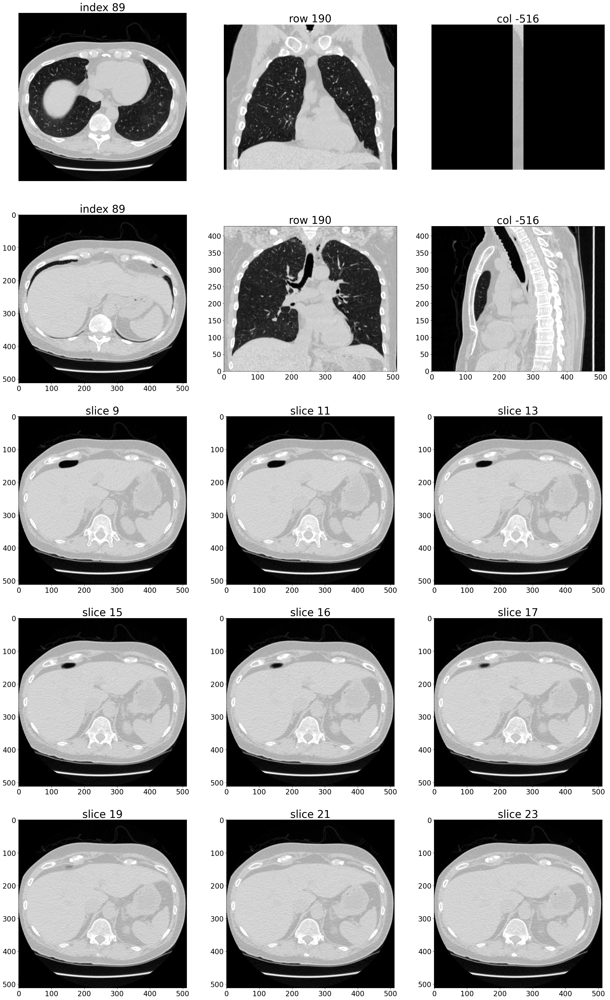

In [4]:
%matplotlib inline
series_uid = positiveSample_list[11][2]
showCandidate(series_uid)

569 Training samples
CT object initialized for series_uid: 1.3.6.1.4.1.14519.5.2.1.6279.6001.104562737760173137525888934217
CT data shape: (429, 512, 512)
Selected sample: CandidateInfoTuple(isNodule_bool=True, diameter_mm=10.46585391, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.104562737760173137525888934217', center_xyz=(-123.409633227, 126.760909147, -473.521660459))


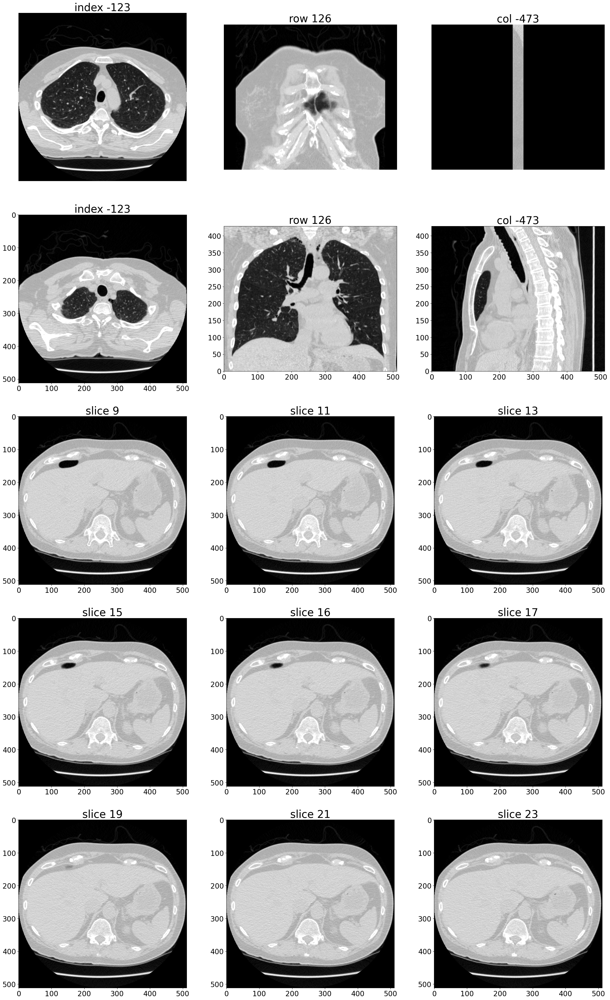

In [5]:
%matplotlib inline
series_uid = positiveSample_list[18][2]
showCandidate(series_uid)

#现在看，立体的，3d的展示
#ipyvolume

In [6]:
import numpy as np
import ipyvolume as ipv  # Corrected the import

V = np.zeros((128,128,128))

V[30:-30, 30:-30, 30:-30] = 0.75
V[35:-35, 35:-35, 35:-35] = 0.0

V[50:-50, 50:-50, 50:-50] = 0.25
V[55:-55, 55:-55, 55:-55] = 0.0

ipv.quickvolshow(V, level=[0.25,0.75], opacity=0.03, level_width=0.1, data_min=0, data_max=1)



2025-01-07 23:05:56,822 - numexpr.utils - INFO - NumExpr defaulting to 8 threads.
/opt/anaconda3/envs/imooc_ai/lib/python3.12/site-packages/ipyvolume/serialize.py:102: RuntimeWarning: invalid value encountered in cast
  subdata[..., i] = ((gradient[i][zindex] / 2.0 + 0.5) * 255).astype(np.uint8)


Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.25, max=1.0, ste…

In [9]:
pip install ipyvolume


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 2.1 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 1.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 9.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 3.2 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 11.0 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install ipython-genutils


Note: you may need to restart the kernel to use updated packages.


In [12]:
from dsets import getCt
ct = getCt(series_uid)
ipv.quickvolshow(ct.hu_a, level = [0.25,0.5,0.9],opacity = 0.1, level_width=0.1,data_min=-1000,data_max = 1000)

Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.25, max=1.0, ste…

In [11]:
# 在 Jupyter Notebook 中，检查是否可以找到 getCt 函数
from dsets import getCt  # 确保导入成功
print(getCt)  # 打印出 getCt 函数，确认它是否有效


<function getCt at 0x12f0d1e40>


In [22]:
import scipy.ndimage.morphology
def build2dLungMask(ct,mask_ndx,threshold_gcc=0.7):
    dense_mask = ct.hu_a[mask_ndx] > threshold_gcc
    denoise_mask = scipy.ndimage.morphology.binary_closing(dense_mask,iterations=2)
    tissue_mask = scipy.ndimage.morphology.binary_opening(denoise_mask,iterations=10)
    body_mask = scipy.ndimage.morphology.binary_fill_holes(tissue_mask)
    air_mask = scipy.ndimage.morphology.binary_fill_holes(body_mask & tissue_mask)

    lung_mask = scipy.ndimage.morphology.binary_dilation(air_mask,iterations = 2)

    return air_mask,lung_mask,dense_mask,denoise_mask,tissue_mask,body_mask

def build3dLungMask(ct):
    air_mask,lung_mask,dense_mask,denoise_mask,tissue_mask,body_mask = mask_list = \
       [np.zeros_like(ct.hu_a,dtype = np.bool_) for _ in range(6)]
    for mask_ndx in range(ct.hu_a.shape[0]):
        for i,mask_ary in enumerate(build2dLungMask(ct,mask_ndx)):
            mask_list[i][mask_ndx] = mask_ary
    return air_mask,lung_mask,dense_mask,denoise_mask,tissue_mask,body_mask

In [23]:
ct = getCt(series_uid)
air_mask,lung_mask,dense_mask,denoise_mask,tissue_mask,body_mask = build3dLungMask(ct)

bones = ct.hu_a * (ct.hu_a>1.5)
lungs = ct.hu_a * air_mask
ipv.figure()
ipv.pylab.volshow(bones + lungs, level=[0.17,0.17,0.23], data_min = 100,data_max = 900)
ipv.show()

/var/folders/wq/ncmnzh4d58v3czq6s0x8hx500000gn/T/ipykernel_34830/3444122152.py:4: DeprecationWarning: Please import `binary_closing` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  denoise_mask = scipy.ndimage.morphology.binary_closing(dense_mask,iterations=2)
/var/folders/wq/ncmnzh4d58v3czq6s0x8hx500000gn/T/ipykernel_34830/3444122152.py:5: DeprecationWarning: Please import `binary_opening` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  tissue_mask = scipy.ndimage.morphology.binary_opening(denoise_mask,iterations=10)
/var/folders/wq/ncmnzh4d58v3czq6s0x8hx500000gn/T/ipykernel_34830/3444122152.py:6: DeprecationWarning: Please import `binary_fill_holes` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  body_mask = scipy.ndimage.morphology.binary_fill_

Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.17, max=1.0, ste…

scipy.ndimage.morphology 已经被弃用，并将在 SciPy 2.0.0 中被移除。

In [ ]:
import scipy.ndimage

def build2dLungMask(ct, mask_ndx, threshold_gcc=0.7):
    dense_mask = ct.hu_a[mask_ndx] > threshold_gcc
    denoise_mask = scipy.ndimage.binary_closing(dense_mask, iterations=2)
    tissue_mask = scipy.ndimage.binary_opening(denoise_mask, iterations=10)
    body_mask = scipy.ndimage.binary_fill_holes(tissue_mask)
    air_mask = scipy.ndimage.binary_fill_holes(body_mask & tissue_mask)

    lung_mask = scipy.ndimage.binary_dilation(air_mask, iterations=2)

    return air_mask, lung_mask, dense_mask, denoise_mask, tissue_mask, body_mask
